# PART TWO: CO2 Emission Analysis and Prediction

This is purely an experimental Notebook.

In [1]:
# Analysis Tools
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import norm
import math

# Plotting Tools
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Extra Plotting Tools Required for Bar Chart Race
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML

# Plot Design Settings
sns.set_style("darkgrid", {"axes.facecolor": "#eff2f5", 'grid.color': '#c0ccd8', 'patch.edgecolor': '#B0B0B0', 'font.sans-serif': 'Verdana'})
sns.set_palette('Dark2_r')
plt.rc('font', size=19)
plt.rc('axes', titlesize=25)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=17)
plt.rc('ytick', labelsize=17)
plt.rc('figure', titlesize=24)

# Other Tools
from sklearn.preprocessing import OneHotEncoder

# Mute warnings
import warnings
warnings.filterwarnings('ignore')

## Load Base Data

In [2]:
# Load Base Data
df = pd.read_csv("data/Our_CO2emission_Clean_Data.csv")

In [3]:
df.head()

,Unnamed: 0,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
0,0,World,all,1988,345.56,347.41,42106.6,4927545.08,70.13,8.21,21163.84
1,1,World,coal,1988,96.87,98.48,42106.6,4927545.08,70.13,8.21,8930.92
2,2,World,nat_gas,1988,71.01,71.85,42106.6,4927545.08,70.13,8.21,3571.68
3,3,World,pet/oth,1988,133.45,132.49,42106.6,4927545.08,70.13,8.21,8661.24
4,4,World,nuclear,1988,19.23,19.23,42106.6,4927545.08,70.13,8.21,0.00


In [4]:
# Drop Unamed Column
df = df.drop('Unnamed: 0', axis=1)

It will be interesting to see how we can enrich the dataset with extra features

EXAMPLE:

* Rate of population change; To see if a possible change in population of a place will result in change in CO2 emission & to What extent
* Economic activity data; To see how the economic activities of a place plays in co2 Emission
* Poverty data
* Population density; Does the density of a population have any effect on CO2 Emission?
* GDP splits, e.g. % for agriculture vs manufacturing; Hypothetically, GDP increase due to agricultural/Green activities should oppose the direct correlation of rise in GDP to CO2 Emission


Also; while researching why the Dip occurred in 2009 and the sudden rise in 2010 when Energy Type, Pop, and GDP were Constant.... 
<img src="https://media.discordapp.net/attachments/982261497013104680/987131522475782194/unknown.png?width=1025&height=308" width=100%/> 
We Discovered this...

https://www.reuters.com/article/idINIndia-53062920101121
“The real surprise was that we were expecting a bigger dip due to the financial crisis in terms of fossil fuel emissions,” said Pep Canadell, executive director of the Global Carbon Project and one of the co-authors of the study published in the latest issue of the journal Nature Geoscience.
Scientists say rising levels of CO2, the main greenhouse gas, from burning fossil fuels and deforestation is heating up the planet

So we had BURNING FOSSIL FUEL covered but not the impact of DEFORESTATION...

FROM: [Measuring Carbon Emissions from Tropical Deforestation: An Overview]

Tropical deforestation contributes about 20% of annual global greenhouse gas (GHG) emissions and reducing it will be necessary to avoid dangerous climate change. China and the US are the world’s number one and two emitters, but numbers three and four are Indonesia and Brazil, with ~80% and ~70% of their emissions respectively from deforestation.

So we got a dataset that speaks of the FOREST AREA in % per country per year from 1990 to 2020 https://data.worldbank.org/indicator/AG.LND.FRST.ZS


**These are but a few hunches we hope to review in this Notebook.**

## Load Additional Data

Let's Load the required Data

All additional Data were Sourced from the World Bank page

1. Population Growth: https://data.worldbank.org/indicator/SP.POP.GROW

2. Economy & Growth Data: https://data.worldbank.org/topic/3?end=2021&start=2000

3. Poverty Data: https://data.worldbank.org/topic/11

4. Population Density per Country: https://data.worldbank.org/indicator/EN.POP.DNST

5. Agri GDP Contribution: https://data.worldbank.org/indicator/NV.AGR.TOTL.ZS

6. Manufacturing GDP Contribution: https://data.worldbank.org/indicator/NV.IND.MANF.ZS

7. Deforestation Impact per country:
https://data.worldbank.org/indicator/AG.LND.FRST.ZS

In [5]:
"""
We Omitted 
1. Economy & Growth Data: Due to High number of varibles to deal with against Tie for the project
2. Poverty Data: Heavy amount of missing values and not representative at all
"""

# Load Population Growth
pop_df = pd.read_csv("data/Population_Growth_from_world_Bank_Integrate.csv")
# Load Population Density per Country
den_df = pd.read_excel('data/Population_Density_per_country_data.xls')
# Load Manufacturing GDP Contribution
mgdp_df = pd.read_excel('data/GDP_split_Manufacturing_contribution_data_per_Country.xls')
# Load Agri GDP Contribution
agdp_df = pd.read_excel('data/GDP_split_Agricultural_contribution_data_per_Country.xls')
# Load Deforestation Impact per country
forest_df = pd.read_csv("data/Deforestation_data.csv")

Let's verify loaded datasets

In [6]:
df.head(3)

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
0,World,all,1988,345.56,347.41,42106.6,4927545.08,70.13,8.21,21163.84
1,World,coal,1988,96.87,98.48,42106.6,4927545.08,70.13,8.21,8930.92
2,World,nat_gas,1988,71.01,71.85,42106.6,4927545.08,70.13,8.21,3571.68


In [7]:
pop_df.head(3)

,Country Name,1988,1989,1990,1991,1992,1993,1994,1995,1996,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,-1.246457,-0.063879,1.816830,3.898739,5.446052,6.048669,5.644930,4.610156,3.531110,...,0.503385,0.583290,0.590508,0.541048,0.502860,0.471874,0.459266,0.437415,0.428017,NaN
1,Africa Eastern and Southern,2.987172,2.956405,2.913059,2.871078,2.832013,2.791294,2.751374,2.710420,2.673851,...,2.763426,2.761496,2.750400,2.732598,2.712218,2.690902,2.665620,2.636666,2.605427,NaN
2,Afghanistan,0.116008,2.136295,4.476954,6.900124,8.546107,8.790897,7.659796,5.884279,4.019478,...,3.407600,3.494592,3.355602,3.077054,2.778035,2.547833,2.384309,2.313073,2.303812,NaN


In [8]:
den_df.head(3)

,Country Name,Indicator Name,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,Population density (people per sq. km of land ...,NaN,307.966667,312.411111,314.994444,316.827778,318.650000,320.566667,322.466667,...,569.805556,573.138889,576.533333,579.661111,582.583333,585.338889,588.033333,590.611111,593.144444,NaN
1,Africa Eastern and Southern,Population density (people per sq. km of land ...,NaN,9.078367,9.312152,9.554904,9.806505,10.067014,10.336516,10.615566,...,36.974250,37.995279,39.040385,40.107067,41.195114,42.303709,43.431367,44.576507,45.737916,NaN
2,Afghanistan,Population density (people per sq. km of land ...,NaN,14.044981,14.323809,14.617529,14.926281,15.250311,15.585026,15.929810,...,47.730567,49.428043,51.114793,52.712072,54.196961,55.595550,56.937049,58.269395,59.627395,NaN


In [9]:
mgdp_df.head(3)

,Country Name,Indicator Name,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,"Manufacturing, value added (% of GDP)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Africa Eastern and Southern,"Manufacturing, value added (% of GDP)",NaN,NaN,NaN,NaN,NaN,12.321753,12.25253,12.92253,...,10.495111,10.112550,9.991852,10.213868,10.522995,10.585756,10.636882,10.640794,10.512171,NaN
2,Afghanistan,"Manufacturing, value added (% of GDP)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,12.486085,11.499867,11.477588,11.420006,4.114197,3.530422,6.160177,7.043181,7.676257,NaN


In [10]:
agdp_df.head(3)

,Country Name,Indicator Name,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,"Agriculture, forestry, and fishing, value adde...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Africa Eastern and Southern,"Agriculture, forestry, and fishing, value adde...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,10.809624,11.139972,11.915450,12.762394,12.847244,12.545027,11.987675,12.502325,14.665698,NaN
2,Afghanistan,"Agriculture, forestry, and fishing, value adde...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,24.390874,22.810663,22.137041,20.634323,25.740314,26.420199,22.042897,25.773971,26.820600,NaN


In [11]:
forest_df.head(3)

,Country Name,Indicator Name,1988,1989,1990,1991,1992,1993,1994,1995,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,Forest area (% of land area),NaN,NaN,2.333333,2.333333,2.333333,2.333333,2.333333,2.333333,...,2.333333,2.333333,2.333333,2.333333,2.333333,2.333333,2.333333,2.333333,2.333333,NaN
1,Africa Eastern and Southern,Forest area (% of land area),NaN,NaN,40.565912,40.403946,40.235807,40.269690,40.103270,39.936851,...,31.972492,31.761842,31.551270,31.340526,31.119431,30.903543,30.690224,30.469798,30.251786,NaN
2,Afghanistan,Forest area (% of land area),NaN,NaN,1.850994,1.850994,1.850994,1.850994,1.850994,1.850994,...,1.850994,1.850994,1.850994,1.850994,1.850994,1.850994,1.850994,1.850994,1.850994,NaN


Cool... A couple of missing areas, but let's extract the essentials by integrating into our base Data and see if we still experience this amount of missing values. Let's Begin Integrating this additional Datasets one after the Other

### Integrating Population Growth to Base DF

**OBSERVATION:** After Careful studies, we observed that several countries have either been integrated into another or have had their names modified or changed thereby tending to result in lot's of missing values. SEE the table below

| Country Name in Data | Current Name | Replacement Name |**Special Case** |
| --- | --- | --- |--- |
| Burma | Myanmar | Myanmar |
| Congo-Brazzaville | Republic of the Congo | Congo, Rep. |
| Congo-Kinshasa | Democratic Republic of the Congo | Congo, Dem. Rep. |
| Côte d’Ivoire | --- | Cote d'Ivoire |
| Guadeloupe | overseas département and overseas region of FRANCE | **DROP** |
| Laos | Lao People's Democratic Republic | Lao PDR |
| Macau | special administrative region CHINA | Macao SAR, China |
| Martinique | Island and overseas territorial collectivity of FRANCE | **DROP** |
| North Korea | Korea, Dem. People's Rep. | Korea, Dem. People's Rep. | **Lump Together North & South Korea** |
| Reunion | Réunion La Réunion (French) | **DROP** |
| Saint Kitts and Nevis | Federation of Saint Christopher and Nevis | St. Kitts and Nevis |
| Saint Lucia | --- | St. Lucia |
| Saint Vincent/Grenadines | --- | St. Vincent and the Grenadines |
| South Korea | Korea, Dem. People's Rep. | --- | **Lump Together North & South Korea** |
| Taiwan | Republic of China (ROC) | **DROP** |
| The Bahamas | --- | Bahamas, The |
| Kyrgyzstan | Kyrgyz Republic | Kyrgyz Republic |
| Slovakia | Slovak Republic | Slovak Republic |
| Palestinian Territories | Israel | West Bank and Gaza |

So Let's proceed to making this changes...

In [12]:
'''
This countries Have been merged to Major countries already present
in our Dataset and won't be present in dataset adding the additional 
features, hence deleting them.
'''
# Drop Rows of Countries: Guadeloupe, Martinique, Reunion, Taiwan
df = df[df.Country.isin(['Guadeloupe', 'Martinique', 'Reunion', 'Taiwan'])==False]

In [13]:
# Decalre Replacement Names as Dict
replace_values = {'Burma' : 'Myanmar', 
                  'Congo-Brazzaville' : 'Congo, Rep.', 
                  'Congo-Kinshasa' : 'Congo, Dem. Rep.', 
                  "Côte d’Ivoire": "Cote d'Ivoire",
                  "Laos": 'Lao PDR', 
                  'Macau': 'Macao SAR, China', 
                  'Saint Kitts and Nevis': 'St. Kitts and Nevis',
                  'Saint Lucia': 'St. Lucia', 
                  'Saint Vincent/Grenadines': 'St. Vincent and the Grenadines',
                  'The Bahamas': 'Bahamas, The', 'Kyrgyzstan': 'Kyrgyz Republic', 
                  'Slovakia': 'Slovak Republic',
                  'Palestinian Territories': 'West Bank and Gaza'
                 }    
# Apply Replacement Names
df = df.replace({"Country": replace_values})   

In [14]:
# Check
df[df['Country'] == 'Myanmar'].head(1)

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,CO2_emission
150,Myanmar,all,1988,0.09,0.08,26.35,40085.6,2.13,3.23,4.83


In [15]:
# Let's Progress with a Copy of our DF
copy_df = df.copy()

In [16]:
# Defining function that Integrates Pop_Growth
def add_pop_growth(row):
    
    val = pop_df.loc[pop_df["Country Name"].str.contains(row['Country']), str(row['Year'])]
    return round(float(list(val)[0]),3) if len(val)>0 else np.NaN

In [17]:
# Applying Fuction
copy_df['pop_growth'] = copy_df.apply(add_pop_growth, axis=1)

In [18]:
# Check for missing values
copy_df[copy_df["pop_growth"].isnull()]["Country"].unique()

array(['North Korea', 'South Korea', 'New Zealand', 'Kuwait', 'Eritrea'],
      dtype=object)

In [19]:
# Check Why 'New Zealand', 'Kuwait', 'Eritrea' has Null Values
pop_df[pop_df['Country Name'].isin(['New Zealand', 'Kuwait', 'Eritrea'])]

,Country Name,1988,1989,1990,1991,1992,1993,1994,1995,1996,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
69,Eritrea,2.698315,2.062087,1.225239,0.340641,-0.387405,-0.843468,-0.906208,-0.642556,-0.352672,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
127,Kuwait,4.829305,2.807409,0.122441,-3.104610,NaN,NaN,NaN,NaN,1.296184,...,5.550008,5.165482,4.560848,3.844185,3.112854,2.477113,1.982437,1.672132,1.497756,NaN
180,New Zealand,0.274482,0.480054,0.923223,NaN,1.041735,1.140231,1.329237,1.464364,1.582662,...,0.548221,0.768348,1.661012,2.036034,2.246032,2.088723,1.791240,1.593167,2.086804,NaN


#### Observation & Possible Recommendation

We have some countries having some missing pop_growth values for some years

| Country | Year's with Missing Values | **Action** |
| --- | --- | --- |
| New Zealand | 1991 only | **Fill with mean** |
| Kuwait | 1992 to 1995  | **Fill with mean** |
| Eritrea | 2012 to 2019 | **Fill with mean** |

Values of North and South Korea needs to be Lumped together as `Korea, Dem. People's Rep`

### Integrating Population Density to Modified DF

In [20]:
# Check df prior to integration
den_df.tail()

,Country Name,Indicator Name,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
261,Kosovo,Population density (people per sq. km of land ...,NaN,88.729678,91.301552,93.873427,96.445302,99.017176,101.589051,104.252779,...,165.987508,166.998898,166.507853,164.250574,163.273354,164.508405,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",Population density (people per sq. km of land ...,NaN,10.214660,10.367390,10.524778,10.685452,10.848618,11.016234,11.189789,...,46.353346,47.629812,48.910900,50.188232,51.457867,52.720441,53.977845,55.234051,56.491786,NaN
263,South Africa,Population density (people per sq. km of land ...,NaN,14.446194,14.809893,15.186966,15.577000,15.979720,16.394710,16.822217,...,43.552135,44.256506,44.963015,45.657263,46.334278,46.995483,47.640752,48.271989,48.890593,NaN
264,Zambia,Population density (people per sq. km of land ...,NaN,4.256622,4.386184,4.519968,4.658673,4.802951,4.952922,5.108862,...,19.458357,20.079031,20.715631,21.360753,22.011930,22.671287,23.341334,24.026465,24.729894,NaN
265,Zimbabwe,Population density (people per sq. km of land ...,NaN,10.094450,10.441280,10.801928,11.174497,11.557911,11.951247,12.355758,...,33.902414,34.510477,35.121391,35.710591,36.268161,36.801342,37.324058,37.858273,38.420388,NaN


In [21]:
# Defining function that Integrates Pop_Density
def add_pop_den(row):
    
    val = den_df.loc[den_df["Country Name"].str.contains(row['Country']), str(row['Year'])]
    return round(float(list(val)[0]),3) if len(val)>0 else np.NaN

In [22]:
# Applying Fuction
copy_df['pop_density'] = copy_df.apply(add_pop_den, axis=1)

In [23]:
# Check for missing values
copy_df[copy_df["pop_density"].isnull()]["Country"].unique()

array(['Luxembourg', 'North Korea', 'South Korea', 'Kuwait', 'Kosovo'],
      dtype=object)

In [24]:
# Additional info about columns
copy_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35154 entries, 0 to 35921
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country       35154 non-null  object 
 1   e_type        35154 non-null  object 
 2   Year          35154 non-null  int64  
 3   e_con         35154 non-null  float64
 4   e_prod        35154 non-null  float64
 5   GDP           35154 non-null  float64
 6   Population    35154 non-null  float64
 7   ei_capita     35154 non-null  float64
 8   ei_gdp        35154 non-null  float64
 9   CO2_emission  35154 non-null  float64
 10  pop_growth    34692 non-null  float64
 11  pop_density   34668 non-null  float64
dtypes: float64(9), int64(1), object(2)
memory usage: 3.5+ MB


So we see a couple of additional missing values present in the population density Column for Countries 'Luxembourg', 'North Korea', 'South Korea', 'Kuwait', 'Kosovo'

We will look to treat this later

### Integrating GDP Split (Agric & Manuf) to Modified DF

In [25]:
# Defining function that Integrates Manufacturing GDP Contribution
def add_gdp_manu(row):
    
    val = mgdp_df.loc[mgdp_df["Country Name"].str.contains(row['Country']), str(row['Year'])]
    return round(float(list(val)[0]),3) if len(val)>0 else np.NaN

# Defining function that Integrates Agricuture GDP Contribution
def add_gdp_agri(row):
    
    val = agdp_df.loc[agdp_df["Country Name"].str.contains(row['Country']), str(row['Year'])]
    return round(float(list(val)[0]),3) if len(val)>0 else np.NaN

In [26]:
# Applying Fuction Respectively
copy_df['manuf_GDP'] = copy_df.apply(add_gdp_manu, axis=1)
copy_df['agri_GDP'] = copy_df.apply(add_gdp_agri, axis=1)

In [27]:
# Check for missing values
copy_df[copy_df["manuf_GDP"].isnull()]["Country"].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Aruba',
       'Australia', 'Belgium', 'Bermuda', 'British Virgin Islands',
       'Bulgaria', 'Myanmar', 'Cambodia', 'Canada', 'Cayman Islands',
       'Central African Republic', 'China', 'Comoros', 'Congo, Dem. Rep.',
       "Cote d'Ivoire", 'Djibouti', 'Equatorial Guinea', 'Greece',
       'Hong Kong', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan',
       'Kuwait', 'Lao PDR', 'Lebanon', 'Liberia', 'Libya', 'Luxembourg',
       'Macao SAR, China', 'Madagascar', 'Maldives', 'Mali', 'Mongolia',
       'Mozambique', 'Nicaragua', 'North Korea', 'Oman', 'Peru',
       'Philippines', 'Portugal', 'Qatar', 'Romania', 'St. Lucia',
       'Samoa', 'Sao Tome and Principe', 'Senegal', 'Solomon Islands',
       'South Korea', 'Spain', 'Switzerland', 'Syria', 'Tanzania',
       'Bahamas, The', 'United Kingdom', 'United States', 'Yemen',
       'Somalia', 'Armenia', 'Bosnia and Herzegovina', 'Croatia',
       'Estonia', 'Georgia', 'Kazakhst

In [28]:
copy_df[copy_df["agri_GDP"].isnull()]["Country"].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Aruba',
       'Australia', 'Belgium', 'Bermuda', 'British Virgin Islands',
       'Myanmar', 'Cambodia', 'Canada', 'Cayman Islands',
       'Central African Republic', 'Congo, Dem. Rep.', 'Djibouti',
       'Equatorial Guinea', 'Greece', 'Hong Kong', 'Ireland', 'Israel',
       'Italy', 'Jamaica', 'Japan', 'Kuwait', 'Lao PDR', 'Lebanon',
       'Liberia', 'Libya', 'Luxembourg', 'Macao SAR, China', 'Madagascar',
       'Maldives', 'Mozambique', 'Nicaragua', 'North Korea', 'Peru',
       'Portugal', 'Qatar', 'Romania', 'St. Lucia', 'Samoa',
       'Sao Tome and Principe', 'Solomon Islands', 'South Korea', 'Spain',
       'Switzerland', 'Tanzania', 'Bahamas, The', 'United Kingdom',
       'United States', 'Yemen', 'Somalia', 'Armenia',
       'Bosnia and Herzegovina', 'Croatia', 'Estonia', 'Latvia',
       'Lithuania', 'Moldova', 'Slovenia', 'Georgia', 'Slovak Republic',
       'Bahrain', 'Papua New Guinea', 'Barbados', 'Eritrea', 'V

In [29]:
# Our dataset is getting more interesting; Don't you think so???
copy_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35154 entries, 0 to 35921
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country       35154 non-null  object 
 1   e_type        35154 non-null  object 
 2   Year          35154 non-null  int64  
 3   e_con         35154 non-null  float64
 4   e_prod        35154 non-null  float64
 5   GDP           35154 non-null  float64
 6   Population    35154 non-null  float64
 7   ei_capita     35154 non-null  float64
 8   ei_gdp        35154 non-null  float64
 9   CO2_emission  35154 non-null  float64
 10  pop_growth    34692 non-null  float64
 11  pop_density   34668 non-null  float64
 12  manuf_GDP     29516 non-null  float64
 13  agri_GDP      30990 non-null  float64
dtypes: float64(11), int64(1), object(2)
memory usage: 4.0+ MB


### Integrating Deforestation Data to Modified DF

In [30]:
# Defining function that Integrates Deforestation Data
def add_forest(row):
    
    val = forest_df.loc[forest_df["Country Name"].str.contains(row['Country']), str(row['Year'])]
    return round(float(list(val)[0]),3) if len(val)>0 else np.NaN

In [31]:
# Applying Fuction Respectively
copy_df['Deforestation'] = copy_df.apply(add_forest, axis=1)

In [32]:
# Check for missing values
copy_df[copy_df["Deforestation"].isnull()]["Country"].unique()

array(['World', 'Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Aruba', 'Australia',
       'Austria', 'Bahrain', 'Bangladesh', 'Barbados', 'Belgium',
       'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia', 'Botswana',
       'Brazil', 'British Virgin Islands', 'Brunei', 'Bulgaria',
       'Burkina Faso', 'Myanmar', 'Burundi', 'Cabo Verde', 'Cambodia',
       'Cameroon', 'Canada', 'Cayman Islands', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo, Rep.',
       'Congo, Dem. Rep.', 'Costa Rica', 'Cuba', 'Cyprus',
       "Cote d'Ivoire", 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador',
       'Equatorial Guinea', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland',
       'France', 'Gabon', 'Gambia, The', 'Ghana', 'Greece', 'Grenada',
       'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti',
       'Honduras', 'Hong Kong', 'India', 'Indonesia', 'Iran', 'I

ALl Countries are listed here as a Result of complete missing values from 1988 t0 1989 and maybe a few others within the dataset.

In [34]:
"""
Let's Reposition our Target variable CO2 Emission at the End
"""
# Seperate Other Features From Target Variable
others = copy_df.drop(['CO2_emission'], axis=1)
co = copy_df['CO2_emission']
# concat both Tables 
final_df = pd.concat([others, co], axis=1)

In [35]:
final_df.head()

,Country,e_type,Year,e_con,e_prod,GDP,Population,ei_capita,ei_gdp,pop_growth,pop_density,manuf_GDP,agri_GDP,Deforestation,CO2_emission
0,World,all,1988,345.56,347.41,42106.6,4927545.08,70.13,8.21,2.858,15.229,12.8,10.507,NaN,21163.84
1,World,coal,1988,96.87,98.48,42106.6,4927545.08,70.13,8.21,2.858,15.229,12.8,10.507,NaN,8930.92
2,World,nat_gas,1988,71.01,71.85,42106.6,4927545.08,70.13,8.21,2.858,15.229,12.8,10.507,NaN,3571.68
3,World,pet/oth,1988,133.45,132.49,42106.6,4927545.08,70.13,8.21,2.858,15.229,12.8,10.507,NaN,8661.24
4,World,nuclear,1988,19.23,19.23,42106.6,4927545.08,70.13,8.21,2.858,15.229,12.8,10.507,NaN,0.00


In [36]:
# Count of missing value
for var in final_df:
    print(f'{var}: {final_df[var].isnull().sum()}')

Country: 0
e_type: 0
Year: 0
e_con: 0
e_prod: 0
GDP: 0
Population: 0
ei_capita: 0
ei_gdp: 0
pop_growth: 462
pop_density: 486
manuf_GDP: 5638
agri_GDP: 4164
Deforestation: 3062
CO2_emission: 0


<AxesSubplot:>

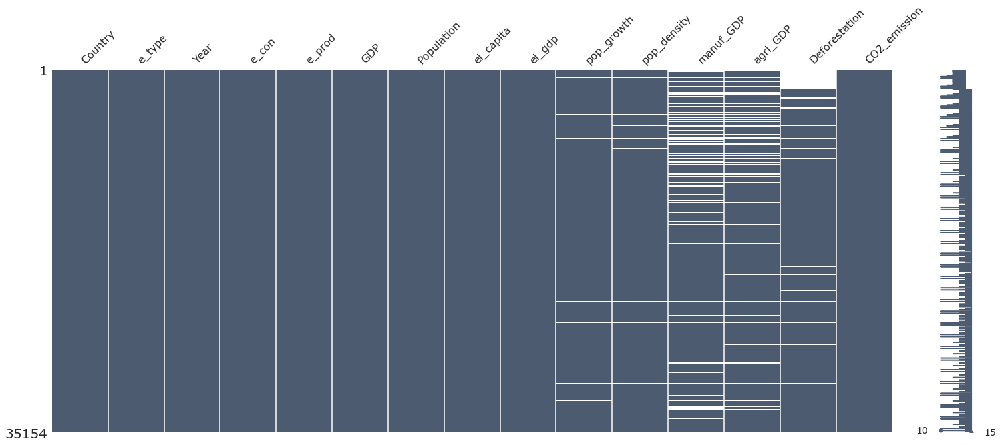

In [37]:
# Let's Visualize our missing values
import missingno as msno

msno.matrix(final_df,color=(0.3,0.36,0.44))

## Auto EDA Using Pandas Profiling

The Pandas Profiling is an auto-EDA library, an open-source option that is written in python. It generates a comprehensive and interactive HTML report for the given dataset. It is able to describe different aspects of the dataset like the type of variables, handling missing values, presence of null values along statistical values – mean, median, mode of the dataset. It also prints the correlation matrix using different correlations for numerical and categorical variables.

In [39]:
import pandas_profiling

#Generating PandasProfiling Report
report = pandas_profiling.ProfileReport(final_df)

In [40]:
# Load/Run Report
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

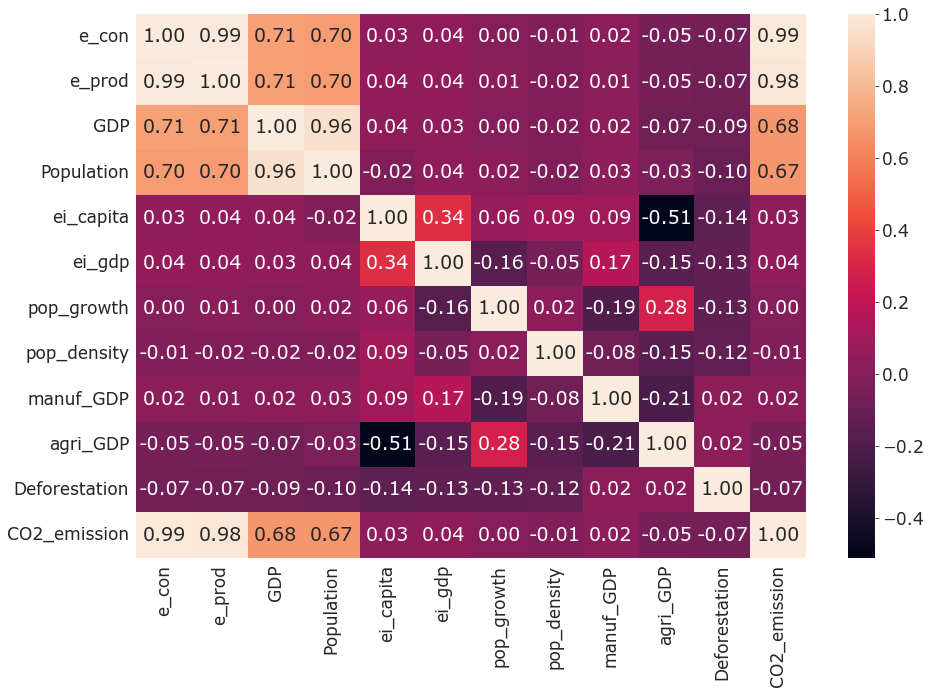

In [41]:
# Blow up Visuals of Correlation Heatmap between Features
plt.figure(figsize=(15,10))
sns.heatmap(data=final_df.iloc[:,3:].corr(), annot=True, fmt='.2f')
plt.show()